## Loading of the necessary modules

In [5]:
# [Modules]
# General Python
import sys
import os
from math import sqrt
import random

# Data structures
import numpy as np  # For creating, manipulating arrays, and array calculations
import pandas as pd # For easy accessible tabular data frames, which can exported to Excel

# Image Processing
from scipy import ndimage as ndi # Imaging

# Regression
from lmfit import minimize, Parameters, report_fit
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score

# Basic image display and plotting tools and notebook settings
import matplotlib as mpl             # Basic plotting module
from matplotlib import pyplot as plt # Basic plotting tools
# Set matplotlib in notebook mode and screen resolutions
%matplotlib notebook
mpl.rcParams['figure.dpi'] = 100     # Set display resolution
mpl.rcParams['savefig.dpi'] = 150    # Set figure save resolution
#import seaborn as sns                # Uses mpl, but makes nicer plots
#sns.set(style="whitegrid")           # Set sns style

# For fancy interactive Plotly graphs
import plotly.plotly as py
import plotly.graph_objs as go
import plotly.tools as tools
from plotly.tools import FigureFactory as ff
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot # For plotly offline mode
# Set plotly to notebook mode
init_notebook_mode(connected=True)
py.sign_in('bjornharink_stanford', 'VqISgcHFwPkY0z50PG47')
#py.sign_in('login_name', 'df8aSdf07asd8faAsd78')  # Plot.ly login and API key, if you have one.

# Bead analysis module
import mrbles as ba

## The main script

### Main config

In [6]:
# Channel settings
DECODE_CHANNELS = slice('l-435','l-780')  # Channel range for decoding
OBJECT_CHANNEL = 'Brightfield'  # Channel for bead finding

# Filtering settings
reference_std_factor_low = 2   # Reference filter xSD from mean low
reference_std_factor_high = 2  # Reference filter xSD from mean high
back_std_factor = 2            # Background filter xSD from mean
set_prob = 2.3                 # Filter based on log probability

### Setting up and loading the reference images
Reference image locations and labels:

In [7]:
# Windows
REF_FOLDER = r"Z:\Data\Setup 1\Bead Reference Files\20170406 - Reference files - KARA"
REF_FILES = {"Dy" : os.path.join(REF_FOLDER, "Dy_Solos_3_MMStack_Pos0.ome.tif"),
             "Sm" : os.path.join(REF_FOLDER, "Sm_solos_5_MMStack_Pos0.ome.tif"),
             "Tm" : os.path.join(REF_FOLDER, "Tm_solos_3_MMStack_Pos0.ome.tif"),
             "Eu" : os.path.join(REF_FOLDER, "Eu_solos_6_MMStack_Pos0.ome.tif")}

REF_BEAD_SIZE = 16  # Estimated bead diameter in pixels
REF_DARK_NOISE = 99  # Camera dark noise

# Setup ref images object
spec_object = ba.ReferenceSpectra(files = REF_FILES, 
                                       object_channel = OBJECT_CHANNEL, 
                                       channels = DECODE_CHANNELS, 
                                       bead_size = REF_BEAD_SIZE, 
                                       dark_noise = REF_DARK_NOISE)
spec_object.crop_x = slice(312, 712)
spec_object.crop_y = slice(312, 712)

# Background image set file location
BACK_FOLDER =  r"Z:\Data\Setup 1\Bead Reference Files"
BACK_FILE = os.path.join(BACK_FOLDER, "20170320_blank_1_MMStack_Pos0.ome.tif")
BACK_ROIx = slice(312, 712)
BACK_ROIy = slice(312, 712)

Process reference images and add Background Spectrum

Spectrum: Dy
No beads: 166
Spectrum: Sm
No beads: 315
Spectrum: Tm
No beads: 199
Spectrum: Eu
No beads: 95
Spectrum Bkg: slice(312, 712, None), slice(312, 712, None)


<IPython.core.display.Javascript object>


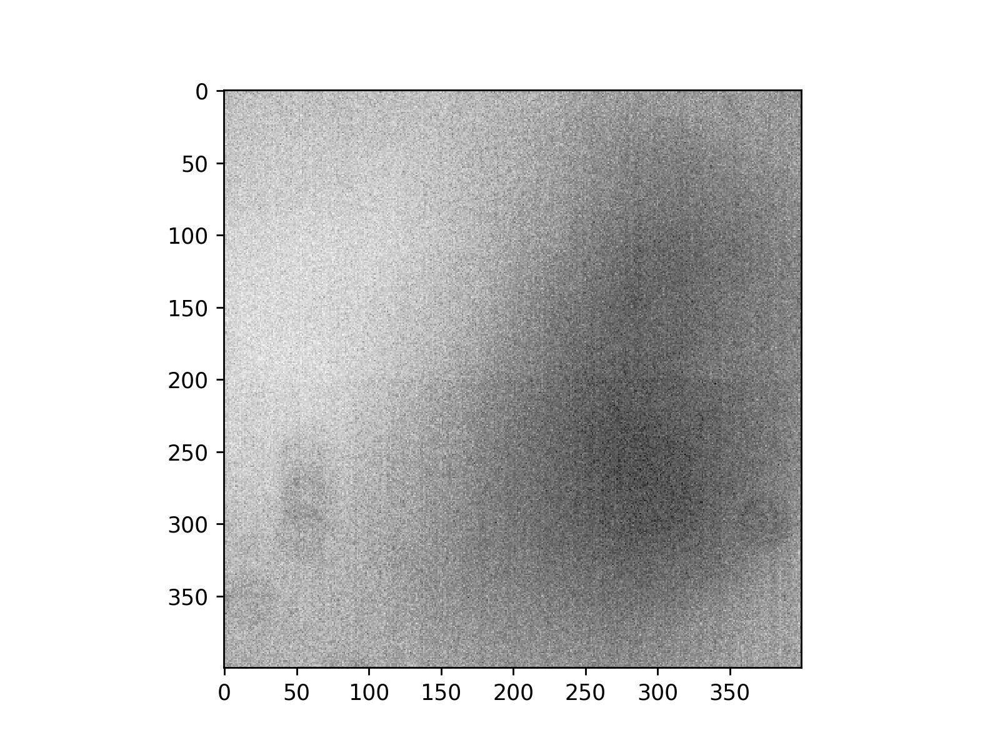

G:\My Drive\[Stanford]\DEV\Encoded Beads Project\Bead Analysis\mrbles\data.py:333: UserWarning:

Channel names not the same or channels unchecked!



<IPython.core.display.Javascript object>


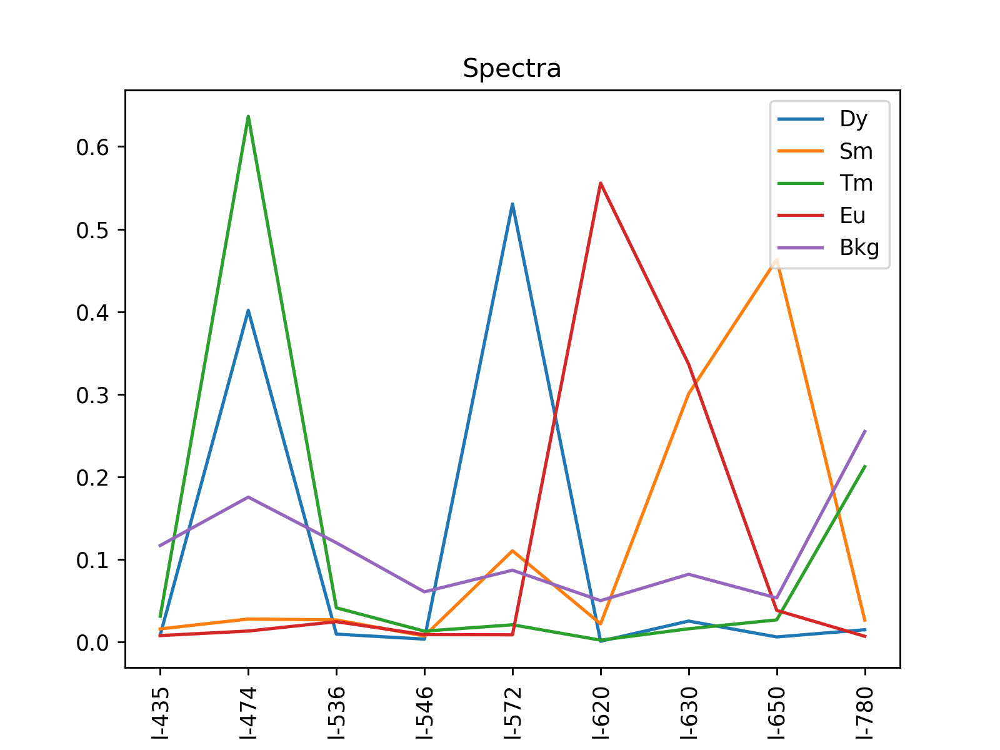

In [4]:
# Process ref images
spec_object.get_spectra()

# Process back image
spec_object.set_back(BACK_FILE, DECODE_CHANNELS, BACK_ROIx, BACK_ROIy)

# Export Sepctra object
ref_data_object = spec_object.output

# Plot spectra
ref_data_object.plot()

### Setting up bead library files

In [8]:
ref_data_object.to_csv("reference_spectra.csv")

In [9]:
# Target file location
TARGET_FOLDER = r"Z:\General\CodeSets"
TARGET_FILE = os.path.join(TARGET_FOLDER, "20150714_DySmTm_48Codes.csv")
target_load = np.genfromtxt(TARGET_FILE, delimiter=',')
target = target_load[:, 1:4]  # Target set to Dy, Sm, Tm (no CeTb) Order: [CeTb, Dy, Sm, Tm]

# Bead library information
SEQ_FOLDER = r""
SEQ_FILE = os.path.join(SEQ_FOLDER, "code2Sequence.xlsx")
sequences = pd.read_excel(SEQ_FILE)

### Set up bead finding, icp, and gmix objects
Except for BEAD_SIZE, these can all stay the default values. They are just expclicity displayed for reference. Technically they can be called like:
- `icp = ba.ICP()`
- `gmix = ba.Classify(target)`

In [49]:
# Bead search and filter parameters
bead_objects = ba.FindBeadsImaging(bead_size=10, border_clear=True)
#bead_objects.area_min = 25
#bead_objects.area_max = 500
bead_objects.eccen_param = 0.75
bead_objects.thr_block = 15
bead_objects.thr_c = 2
bead_objects.mask_bkg_buffer = 2
bead_objects.mask_bkg_size = 11
#bead_objects_cricle = ba.FindBeadsCircle(min_r=5, max_r=7, min_dist=9, param_1=75, param_2=7, annulus_width=2, enlarge = 1.1, border_clear=True)

# ICP settings
icp = ba.ICP(matrix_method='std', max_iter=100, tol=1e-4, outlier_pct=0.01, train=True)

# GMM settings
gmix = ba.Classify(target, tol=1e-5, min_covar=1e-7, sigma=1e-5, train=True)

### Setting up bead images

In [50]:
# Channel(s) settings
ASSAY_CHANNELS = ['Cy5']  # Must be list!

# slice(Y1, Y2) and slice(X1, X2) Y and X are reversed in array since rows (Y) go first and columns go second (X)
# General Region or interest
CROPx = slice(24, 1000)
CROPy = slice(24, 1000)

# Corresponding Flat-Field image
FF_FOLDER = r"Z:\Data\Setup 1\[Flat-Field and Dark-Field Setup 1]"
FF_FILE = os.path.join(FF_FOLDER, "20170815-FF-Cy5-500ms-169im-MED-BIN2-TopDown.tif")
flat_field = ba.tff.TiffFile(FF_FILE).asarray()
flat_field = flat_field/flat_field.max()  # Normalize Flat-Field

# Setting bead image folder and image patterns. This will select all images following the pattern.
BEAD_IMAGE_FOLDER = r"Z:\Data\Setup 1\Huy\20170726 CN PxI2"
BEAD_IMAGE_PATTERNS = {"50 nM" : r"20170726_HQN_CN_PxI2_1Step_50nM_([1-9]|[1-9][0-9])_MMStack_Pos0.ome.tif", 
                       "100 nM" : r"20170726_HQN_CN_PxI2_1Step_100nM_([1-9]|[1-9][0-9])_MMStack_Pos0.ome.tif",
                       "250 nM" : "20170726_HQN_CN_PxI2_1Step_250nM_([1-9]|[1-9][0-9])_MMStack_Pos0.ome.tif",
                       "500 nM" : r"20170726_HQN_CN_PxI2_1Step_500nM_([1-9]|[1-9][0-9])_MMStack_Pos0.ome.tif",
                       "1000 nM" : r"20170726_HQN_CN_PxI2_1Step_1uM_([1-9]|[1-9][0-9])_MMStack_Pos0.ome.tif"}

NORM_IMAGE_FOLDER = r"Z:\Data\Setup 1\Huy\20170726 CN PxI2"
NORM_IMAGE_PATTERN = {"biotin" : r"20170629_HQN_CN_PKIVIT_Pos1to6_Biotinb_([1-9]|[1-9][0-9])_MMStack_Pos0.ome.tif"}
NORM_CHANNEL = 'Cy5'

# Search for files matching the patter in the bead image folder
#bead_image_files = ba.ImageSetRead.scan_path(BEAD_IMAGE_FOLDER, BEAD_IMAGE_PATTERNS['250 nM'])
#bead_image_files = ba.ImageSetRead.scan_path(NORM_IMAGE_FOLDER, NORM_IMAGE_PATTERN['biotin'])
# Load images. This may take some time.
#bead_image_obj = ba.ImageSetRead(bead_image_files)
#print(bead_image_obj.c_names) # Print channel names

# Image shift correction for assay channel(s)
shift_x = 0
shift_y = 0
CROPx_shift = slice(CROPx.start+shift_x, CROPx.stop+shift_x)
CROPy_shift = slice(CROPy.start+shift_y, CROPy.stop+shift_y)

In [12]:
def bead_data_function(image_folder, image_patterns, assay_channels, norm_data=None, norm_channel=None):
    bead_sets_per_bead = {}
    bead_sets_per_code = {}
    bead_images_channels = {}
    bead_set_data_per_bead = {}
    bead_set_data_per_code = {}
    labels_all_bead = {}
    labels_all_inside = {}
    labels_all_annulus = {}
    labels_all_bkg = {}
    for pattern_key, pattern in image_patterns.items():
        print("Analyzing condition: %s" %(pattern_key))
        # Search for files matching the patter in the bead image folder
        bead_image_files = ba.ImageSetRead.scan_path(image_folder, pattern)
        # Load images. This may take some time.
        bead_image_obj = ba.ImageSetRead(bead_image_files)
        # Load decode channsls
        bead_images_decode = bead_image_obj[:,DECODE_CHANNELS, CROPy, CROPx]
        # Load object channel
        bead_images_object = bead_image_obj[:,OBJECT_CHANNEL, CROPy_shift, CROPx_shift]
        # Load assay channel(s)
        if type(assay_channels) is not list:
            assay_channels = [assay_channels]
        for channel_idx, channel in enumerate(assay_channels):
            print("Analyzing channel: %s" %(channel))
            # Assign images, crop, and FF-correct
            assay_images = bead_image_obj[:,channel, CROPy_shift, CROPx_shift] / flat_field[CROPy_shift, CROPx_shift]
            
            # Setup Pandas DataFrame
            bead_set = \
                pd.DataFrame(columns=['img', 'lbl',                           # Image and label number of bead
                                      'dim_x', 'dim_y', 'dim_r', 'dim_area',  # Bead dimensions
                                      'bkg', 'ref',                           # Background and Reference data
                                      'rat_dy', 'rat_sm', 'rat_tm',           # Ratio data
                                       channel])                              # Assay data
            
            # Find beads and create masks
            labels_bead = []
            labels_inside = []
            labels_annulus = []
            labels_bkg = []
            skipped = []
            kept = list(range(len(bead_images_object)))
            bead_no = 0
            range_rad=[350]
            for idx in range(len(bead_images_object)):
                if bead_no == 0:
                    bead_objects.find(bead_images_object[idx], circle_size=340, range=range_rad)
                    range_rad = [bead_objects._mask_radius]
                else:
                    bead_objects.find(bead_images_object[idx], circle_size=340, range=range_rad)
                if bead_objects.bead_num < 1:
                    skipped.append(idx)
                    kept.remove(idx)
                    print("Removed image %i" % (idx+1))
                    continue
                print("Found %i beads in image %i" %(bead_objects.bead_num, idx+1))
                labels_inside.append(bead_objects.mask_inside)
                #labels_inside.append(bead_objects.morph_mask_step(-1,bead_objects.mask_inside))
                labels_bead.append(bead_objects.mask_bead)
                labels_annulus.append(bead_objects.mask_ring)
                labels_bkg.append(bead_objects.mask_bkg)
                circles_dim = bead_objects.bead_dims_bead.as_matrix()
                for lbl_idx, lbl in enumerate(bead_objects.bead_labels):
                    bead_set.loc[bead_no,('img', 'lbl', 
                                          'dim_x', 'dim_y', 'dim_r', 'dim_area')] = [idx, lbl, 
                         circles_dim[lbl_idx, 1], circles_dim[lbl_idx, 2], circles_dim[lbl_idx, 3], circles_dim[lbl_idx, 4]]
                    bead_no += 1
                    
#                 image_cc = color.gray2rgb(bead_objects._masked_img)
#                 dims = np.array(np.round(bead_objects.bead_dims_bead.loc[:,('y_centroid','x_centroid','radius')].values), dtype=np.int)
#                 for center_y, center_x, radius in zip(dims[:,0], dims[:,1], dims[:,2]):
#                     line_y = slice(center_y-radius, center_y+radius)
#                     line_x = slice(center_x-radius, center_x+radius)
#                     image_cc[center_y, line_x] = (20, 20, 220)
#                     image_cc[line_y, center_x] = (20, 20, 220)
#                 plt.figure(dpi=100)
#                 plt.imshow(image_cc, cmap=plt.cm.gray)
                
            print("Total number of beads found: %s" % bead_no)
            
            # Save labeled masks
            labels_all_bead[channel] = labels_bead
            labels_all_inside[channel] = labels_inside
            labels_all_annulus[channel] = labels_annulus
            labels_all_bkg[channel] = labels_bkg

            # Delete skipped images
            bead_images_object = np.delete(bead_images_object, skipped, axis=0)
            bead_images_decode = np.delete(bead_images_decode, skipped, axis=0)
            assay_images = np.delete(assay_images, skipped, axis=0)
            
            # Spectral unmix object
            spec_unmix = ba.SpectralUnmixing(ref_data_object)

            # Set bead number to 0
            bead_no = 0
            for lbls_idx, lbls in enumerate(labels_inside):
                # Get bead labels
                idx = bead_objects.get_unique_values(lbls)

                # Spectrally unmix
                spec_unmix.unmix(bead_images_decode[lbls_idx])

                # Set background and reference images
                background = spec_unmix['Bkg']  # Device background
                reference = spec_unmix['Eu']    # Internal reference: Eu

                # Make ratio images
                ratio_Dy = spec_unmix['Dy'] / reference
                ratio_Sm = spec_unmix['Sm'] / reference
                ratio_Tm = spec_unmix['Tm'] / reference

                # Get ratios from images
                ratio_data = np.empty((len(idx), target[0].size))
                ratio_data[:, 0] = ndi.labeled_comprehension(ratio_Dy, lbls, idx, np.median, float, -1)
                ratio_data[:, 1] = ndi.labeled_comprehension(ratio_Sm, lbls, idx, np.median, float, -1)
                ratio_data[:, 2] = ndi.labeled_comprehension(ratio_Tm, lbls, idx, np.median, float, -1)

                # Get background and reference data from ratio images
                background_data = ndi.labeled_comprehension(background, lbls, idx, np.median, float, -1)
                reference_data = ndi.labeled_comprehension(reference, lbls, idx, np.median, float, -1)

                # Get assay channel data
                assay_data = ndi.labeled_comprehension(assay_images[lbls_idx], labels_annulus[lbls_idx], idx, np.median, float, -1)

                # Subtract background global per image
                #assay_back_glob = ndi.labeled_comprehension(assay_images[lbls_idx], labels_bead[lbls_idx], 0, np.median, float, -1)
                #assay_data_glob = assay_data - assay_back_glob   # Subtract global background value
                #assay_data_glob[assay_data_glob < 0] = 0     # Set threshold to 0
                #assay_data = assay_data_local    

                # Subtract background local per bead
                assay_back_local = ndi.labeled_comprehension(assay_images[lbls_idx], labels_bkg[lbls_idx], idx, np.median, float, -1)
                assay_data_local = assay_data - assay_back_local  # Subtract global background value
                #assay_data_local[assay_data_local < 0] = 0    # Set threshold to 0
                assay_data_final = assay_data_local 

                for lbl in range(bead_objects.get_unique_count(lbls)):
                    bead_set.loc[bead_no,('rat_dy', 'rat_sm', 'rat_tm', 
                                          'bkg', 'ref', 
                                           channel)] = [ratio_data[lbl,0], ratio_data[lbl,1], ratio_data[lbl,2], 
                                                      background_data[lbl], reference_data[lbl], 
                                                      assay_data_final[lbl]]
                    bead_no += 1
                    
            # Filtering
            mask_bkg    = ( (bead_set.bkg > (bead_set.bkg.mean() - back_std_factor * bead_set.bkg.std())) &\
                            (bead_set.bkg < (bead_set.bkg.mean() + back_std_factor * bead_set.bkg.std())) )
            mask_ref    = ( (bead_set.ref > (bead_set.ref.mean() - reference_std_factor_low * bead_set.ref.std())) &\
                            (bead_set.ref < (bead_set.ref.mean() + reference_std_factor_high * bead_set.ref.std())) )
            filter_all = (mask_bkg & mask_ref)

            print("Pre filter: %s" % bead_set.index.size)
            print("Post filter: %s" % bead_set[filter_all].index.size)

            # Pre-filter post-filter images
            for x in range(3):
                idx = random.choice(range(len(assay_images)))
                fig = plt.figure(dpi=150)
                dims_post = bead_set.loc[(bead_set['img'] == kept[idx]), ('dim_x','dim_y','dim_r')].values
                ax = fig.add_subplot(1,2,1)
                ax.axis('off')
                fig.suptitle("Overlay Image Pre-filter image #: %s" % idx)
                ba.FindBeadsImaging.show_cross_overlay(image=bead_images_object[idx], dims=dims_post)
                #ba.FindBeadsImaging.show_image_overlay(assay_images[idx], labels_annulus[idx])
                #ax = fig.add_subplot(1,3,2)
                
                c_dims_post = bead_set.loc[filter_all & (bead_set['img'] == kept[idx]), ('dim_x','dim_y','dim_r')].values
                #ax.imshow(ba.FindBeadsImaging.cirle_overlay(assay_images[idx], dims=c_dims_post), 
                #          cmap='Greys_r')
                ax = fig.add_subplot(1,2,2)
                ax.axis('off')
                fig.suptitle("Overlay Image Post-filter image #: %s" % idx)
                ba.FindBeadsImaging.show_cross_overlay(image=bead_images_object[idx], dims=c_dims_post)
                
            # ICP
            icp.fit(bead_set.loc[filter_all, ('rat_dy', 'rat_sm', 'rat_tm')], target)
            bead_set = bead_set.combine_first(icp.transform())
            print("Tranformation matrix: ", icp.matrix)
            print("Offset vector: ", icp.offset)
            
            # GMM
            gmix.decode(bead_set.loc[filter_all, ('rat_dy_icp', 'rat_sm_icp', 'rat_tm_icp')])
            bead_set = bead_set.combine_first(gmix.output)
            print("Number of unique codes found:", gmix.found)
            print("Missing codes:", gmix.missing)
            s_score = silhouette_score(bead_set.loc[filter_all, ('rat_dy_icp', 'rat_sm_icp', 'rat_tm_icp')], gmix.output.code)
            print("Silhouette Coefficient:", s_score)
            print("AIC:", gmix._gmix.aic(bead_set.loc[filter_all, ('rat_dy_icp', 'rat_sm_icp', 'rat_tm_icp')]))
            print("BIC:", gmix._gmix.bic(bead_set.loc[filter_all, ('rat_dy_icp', 'rat_sm_icp', 'rat_tm_icp')]))
            
            print("Pre-filter:", bead_no)
            print("Pre log-prob filter:", bead_set.loc[(bead_set.code >= 0)].shape[0])
            print("Final beads no.:", bead_set.loc[(bead_set.code >= 0) & (bead_set.log_prob > set_prob)].shape[0])
            print("Total filtered out: %0.2f%%" % ((1-bead_set.loc[(bead_set.code >= 0) & (bead_set.log_prob > set_prob)].shape[0] / bead_set.shape[0])*100))
            print("Filtered/Total: %i/%i" % (bead_set.shape[0] - bead_set.loc[(bead_set.code >= 0) & (bead_set.log_prob > set_prob)].shape[0], bead_set.shape[0])) 
            
            bead_set_data_per_bead[channel] = bead_set
            bead_set_data_per_code[channel] = ba.simp.get_stats_per_code(bead_set[bead_set.log_prob > set_prob], channel, norm=norm_data, norm_channel=norm_channel, codes=48)
            bead_images_channels[channel] = assay_images
        bead_sets_per_bead[pattern_key] = pd.concat(bead_set_data_per_bead)
        bead_sets_per_code[pattern_key] = pd.concat(bead_set_data_per_code)
    return pd.concat(bead_sets_per_bead), pd.concat(bead_sets_per_code)

#### Loading bead images, selecting bead images, and flatfield correction

In [23]:
#bead_norm_per_bead = pd.read_pickle("20170809 - Pix2 biotin.pickle")
#bead_norm_per_bead_biotin = pd.read_csv("201708010_Pix2_ML_biotin.csv")

In [2]:
bead_norm_per_bead, bead_norm_per_code = bead_data_function(NORM_IMAGE_FOLDER, NORM_IMAGE_PATTERN, NORM_CHANNEL)

NameError: name 'NORM_IMAGE_FOLDER' is not defined

In [15]:
#bead_sets_per_bead, bead_sets_per_code = bead_data_function(BEAD_IMAGE_FOLDER, BEAD_IMAGE_PATTERNS, ASSAY_CHANNELS, norm_data=bead_norm_per_bead_biotin, norm_channel='Cy5')

Analyzing condition: 50 nM
Analyzing channel: Cy5
Found 55 beads in image 1
Found 222 beads in image 2
Found 332 beads in image 3
Found 355 beads in image 4
Found 124 beads in image 5
Found 65 beads in image 6
Found 146 beads in image 7
Found 209 beads in image 8
Found 390 beads in image 9
Found 133 beads in image 10
Found 56 beads in image 11
Found 125 beads in image 12
Found 177 beads in image 13
Found 113 beads in image 14
Found 63 beads in image 15
Found 24 beads in image 16
Found 17 beads in image 17
Found 29 beads in image 18
Found 7 beads in image 19
Total number of beads found: 2642


C:\Python36\lib\site-packages\ipykernel_launcher.py:93: DeprecationWarning:


Panel is deprecated and will be removed in a future version.
The recommended way to represent these types of 3-dimensional data are with a MultiIndex on a DataFrame, via the Panel.to_frame() method
Alternatively, you can use the xarray package http://xarray.pydata.org/en/stable/.
Pandas provides a `.to_xarray()` method to help automate this conversion.


C:\Python36\lib\site-packages\ipykernel_launcher.py:102: DeprecationWarning:


Panel is deprecated and will be removed in a future version.
The recommended way to represent these types of 3-dimensional data are with a MultiIndex on a DataFrame, via the Panel.to_frame() method
Alternatively, you can use the xarray package http://xarray.pydata.org/en/stable/.
Pandas provides a `.to_xarray()` method to help automate this conversion.




Pre filter: 2642
Post filter: 2444


<IPython.core.display.Javascript object>


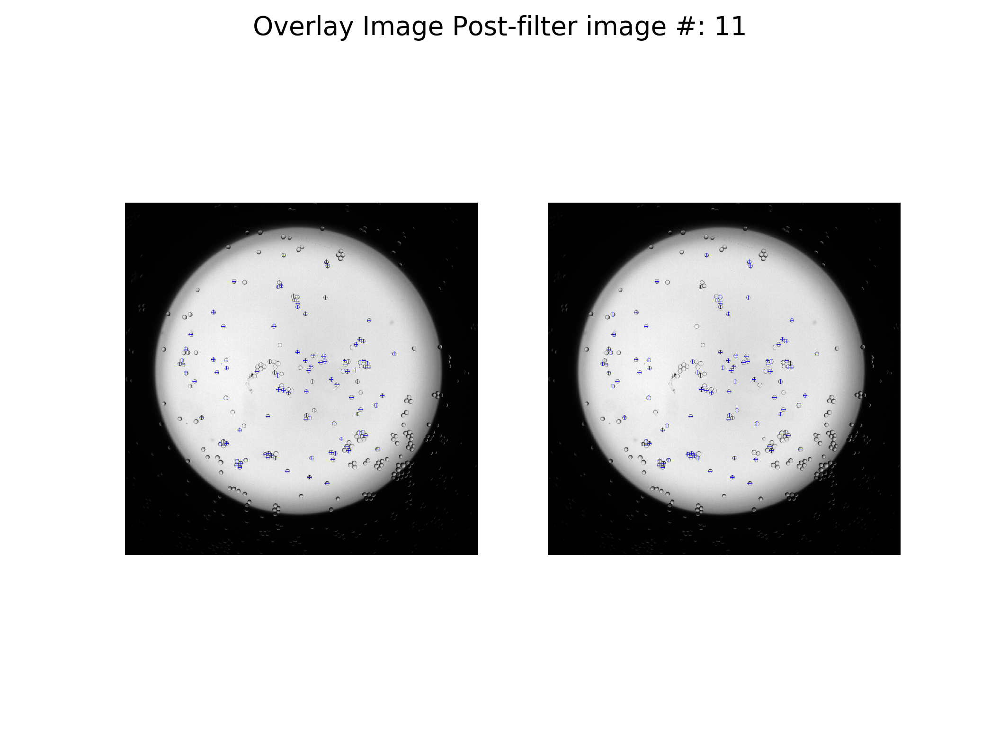

<IPython.core.display.Javascript object>


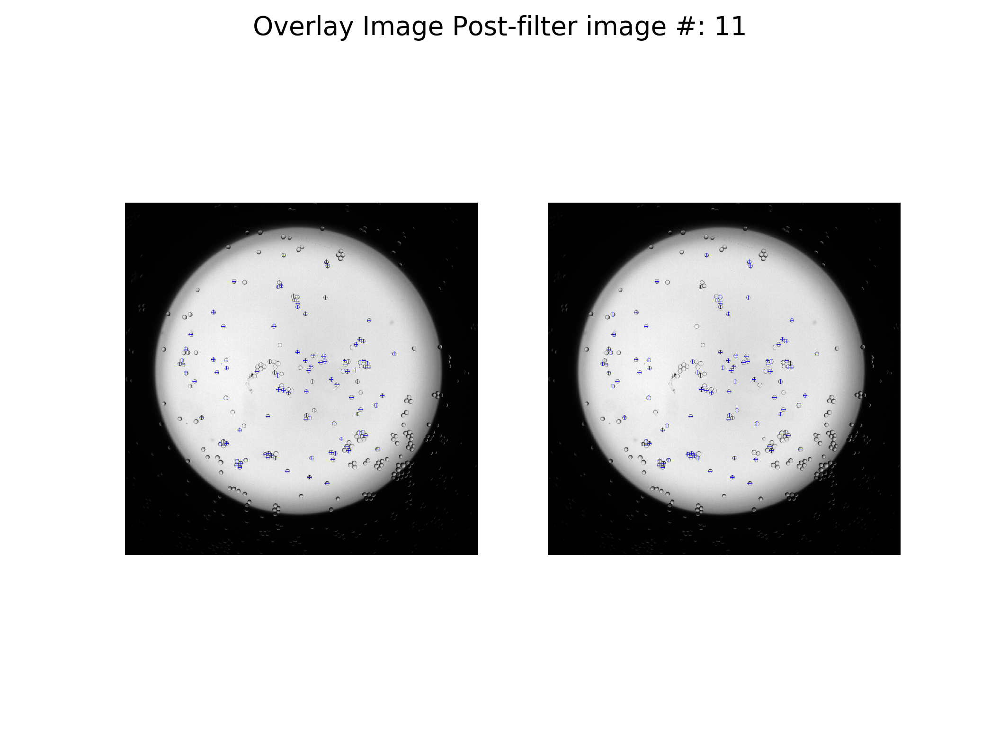

<IPython.core.display.Javascript object>


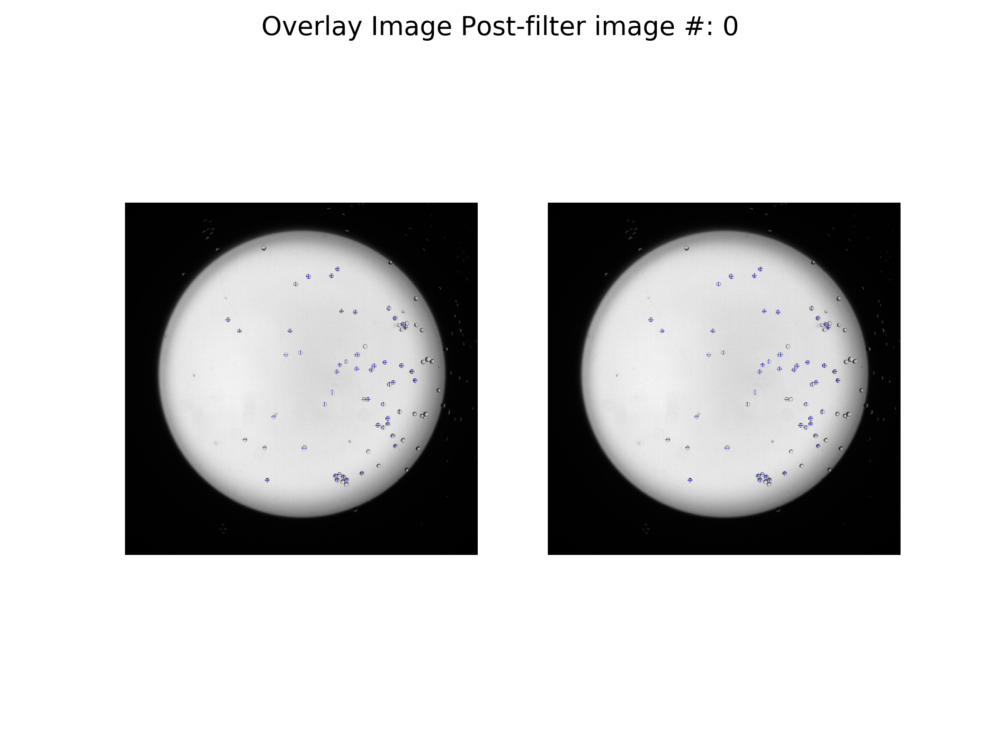

Delta:  0.341476666076
Delta:  0.0373696289636
Delta:  0.0208628508291
Delta:  0.0155145458705
Delta:  0.0164151643909
Delta:  0.0265197299002
Delta:  0.0581564208526
Delta:  0.021907950443
Delta:  0.000233623238407
Delta:  0.000280275367614
Delta:  0.0
Converged after: 11
Tranformation matrix:  [[  1.80838060e-01  -4.02615313e-03   2.49933892e-02]
 [  5.57051540e-03   3.43590296e-01   7.54325243e-03]
 [  7.38773541e-05  -2.95624957e-03   8.55018643e-01]]
Offset vector:  [-0.00258763 -0.00721033 -0.01087229]


D:\Google Drive\[UCSF]\[Software]\DEV\Encoded Beads Project\Bead Analysis\bead_analysis\core.py:1096: UserWarning:

Training mode: ON



Number of unique codes found: 48
Missing codes: None
Silhouette Coefficient: 0.654719649241
AIC: -30216.6552712
BIC: -27437.7888288
Pre-filter: 2642
Pre log-prob filter: 2444
Final beads no.: 2403
Total filtered out: 9.05%
Filtered/Total: 239/2642
Analyzing condition: 100 nM
Analyzing channel: Cy5
Found 29 beads in image 1
Found 89 beads in image 2
Found 52 beads in image 3
Found 61 beads in image 4
Found 187 beads in image 5
Found 223 beads in image 6
Found 120 beads in image 7
Found 87 beads in image 8
Found 231 beads in image 9
Found 364 beads in image 10
Found 145 beads in image 11
Found 56 beads in image 12
Found 87 beads in image 13
Found 277 beads in image 14
Found 329 beads in image 15
Found 252 beads in image 16
Found 58 beads in image 17
Found 41 beads in image 18
Found 91 beads in image 19
Found 192 beads in image 20
Found 194 beads in image 21
Found 43 beads in image 22
Total number of beads found: 3208
Pre filter: 3208
Post filter: 2934


<IPython.core.display.Javascript object>


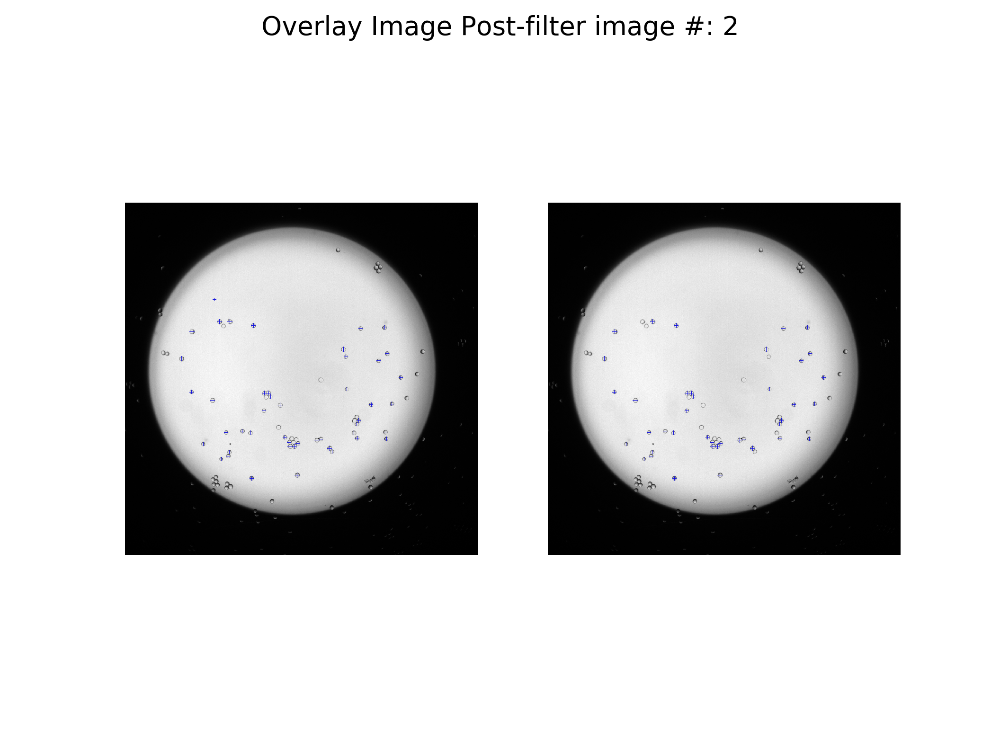

<IPython.core.display.Javascript object>


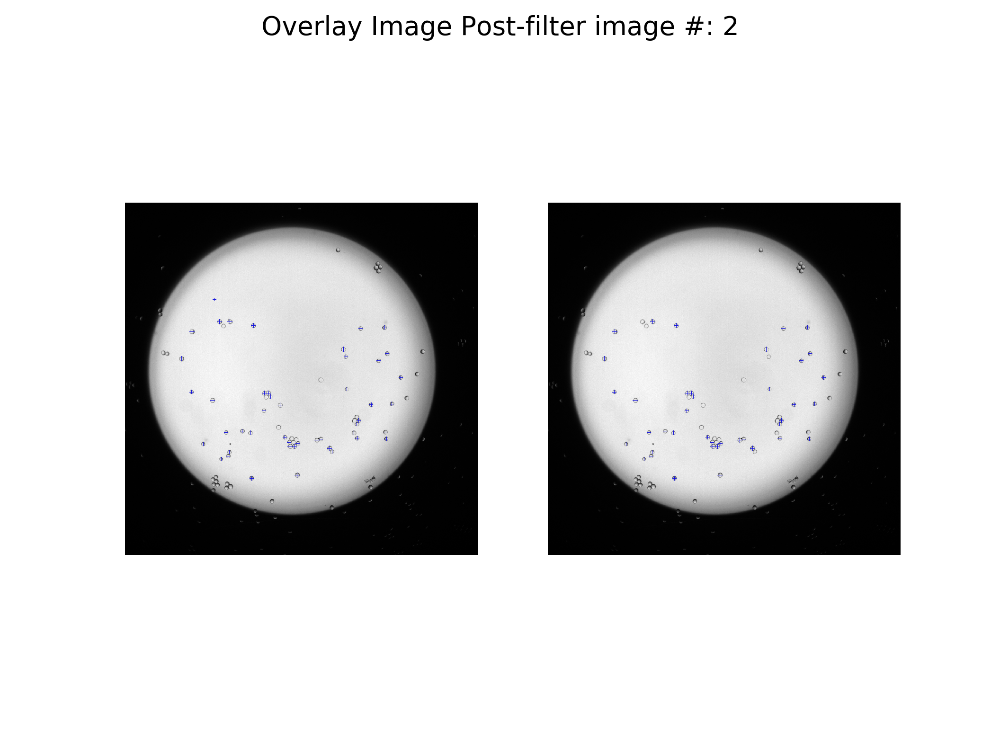

<IPython.core.display.Javascript object>


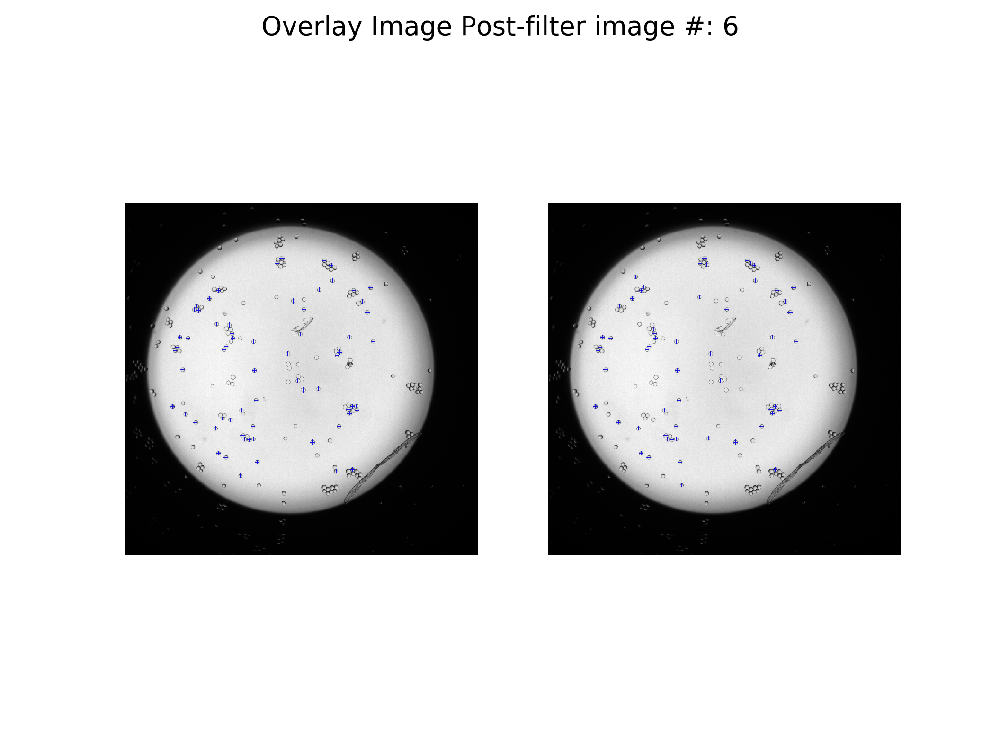

D:\Google Drive\[UCSF]\[Software]\DEV\Encoded Beads Project\Bead Analysis\bead_analysis\core.py:1007: UserWarning:

Training mode: ON

D:\Google Drive\[UCSF]\[Software]\DEV\Encoded Beads Project\Bead Analysis\bead_analysis\core.py:1012: UserWarning:

Training mode: ON



Delta:  0.0100952244883
Delta:  0.000769391598923
Delta:  0.0
Converged after: 3
Tranformation matrix:  [[  1.78753247e-01  -4.04277403e-03   2.85392674e-02]
 [  5.72896641e-03   3.42215096e-01   6.21947591e-03]
 [ -6.28420160e-04  -2.24202086e-03   8.46530507e-01]]
Offset vector:  [-0.0021025  -0.0071392  -0.00851306]
Number of unique codes found: 48
Missing codes: None
Silhouette Coefficient: 0.659186789398
AIC: -36321.3715317
BIC: -33454.9771134
Pre-filter: 3208
Pre log-prob filter: 2934
Final beads no.: 2874
Total filtered out: 10.41%
Filtered/Total: 334/3208
Analyzing condition: 250 nM
Analyzing channel: Cy5
Found 22 beads in image 1
Found 55 beads in image 2
Found 57 beads in image 3
Found 104 beads in image 4
Found 34 beads in image 5
Found 114 beads in image 6
Found 123 beads in image 7
Found 74 beads in image 8
Found 71 beads in image 9
Found 25 beads in image 10
Found 56 beads in image 11
Found 126 beads in image 12
Found 139 beads in image 13
Found 136 beads in image 14
Foun

<IPython.core.display.Javascript object>


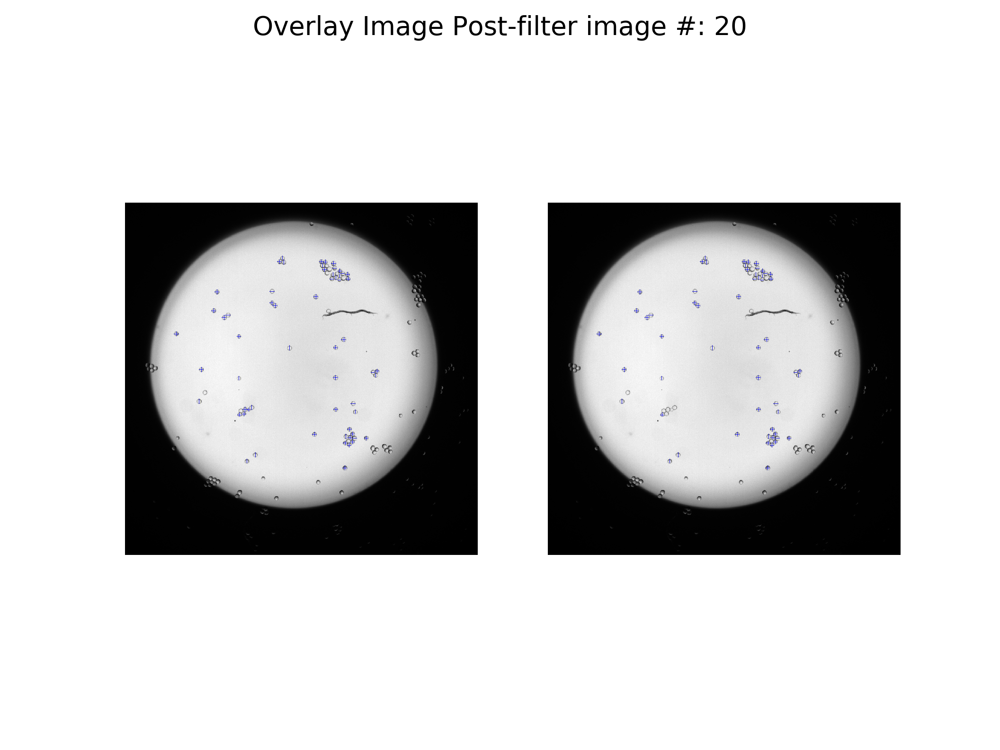

<IPython.core.display.Javascript object>


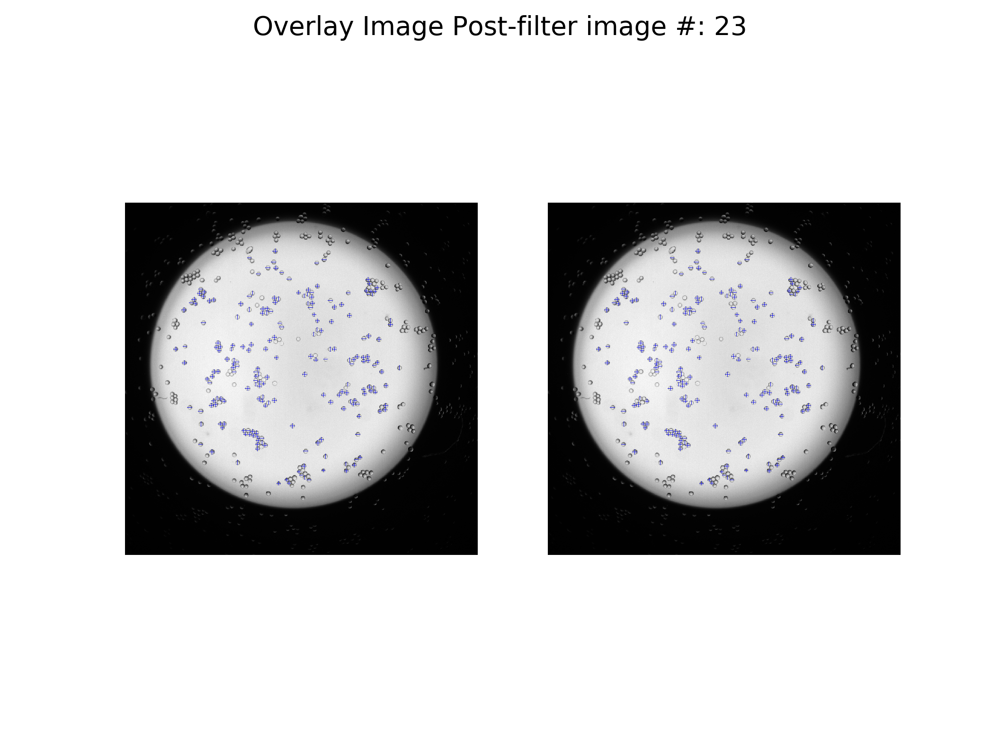

<IPython.core.display.Javascript object>


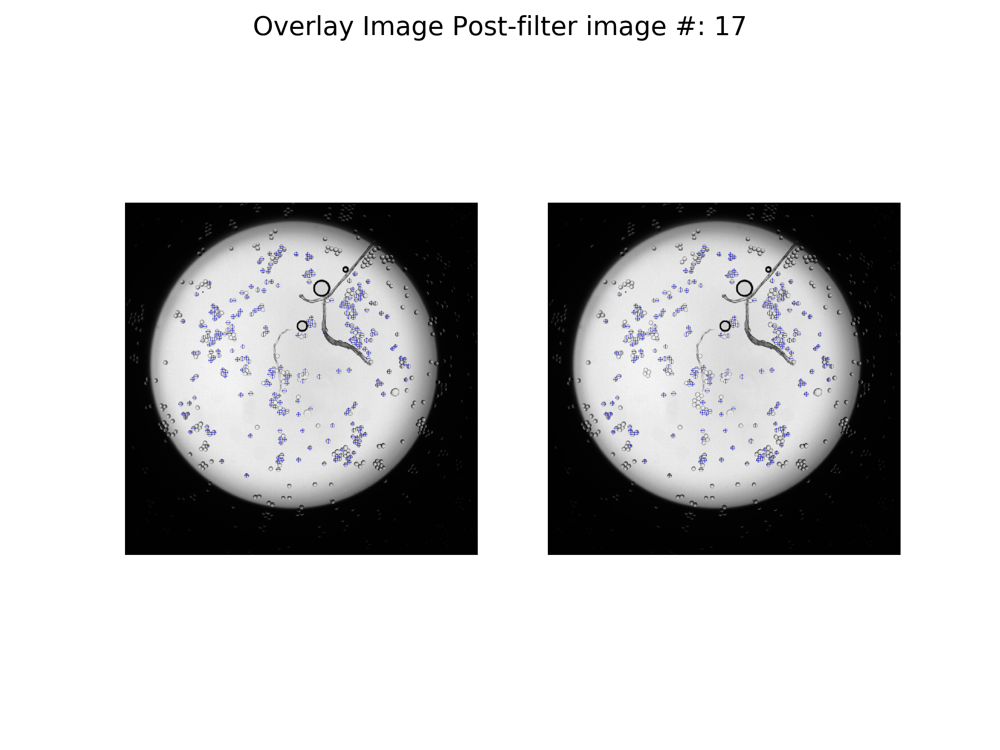

Delta:  0.0127785280996
Delta:  0.00245060006199
Delta:  0.000191547453049
Delta:  0.0
Converged after: 4
Tranformation matrix:  [[  1.80056373e-01  -4.45589901e-03   3.09181069e-02]
 [  4.62556721e-03   3.44114449e-01   5.54601460e-03]
 [ -7.84743470e-05  -3.01680165e-03   8.59784663e-01]]
Offset vector:  [-0.0001362  -0.00727198 -0.00643063]
Number of unique codes found: 48
Missing codes: None
Silhouette Coefficient: 0.678755688759
AIC: -35090.2234667
BIC: -32249.8270269
Pre-filter: 3031
Pre log-prob filter: 2779
Final beads no.: 2716
Total filtered out: 10.39%
Filtered/Total: 315/3031
Analyzing condition: 500 nM
Analyzing channel: Cy5
Found 20 beads in image 1
Found 12 beads in image 2
Found 28 beads in image 3
Found 24 beads in image 4
Found 173 beads in image 5
Found 65 beads in image 6
Found 53 beads in image 7
Found 37 beads in image 8
Found 36 beads in image 9
Found 101 beads in image 10
Found 55 beads in image 11
Found 158 beads in image 12
Found 170 beads in image 13
Found 27

<IPython.core.display.Javascript object>


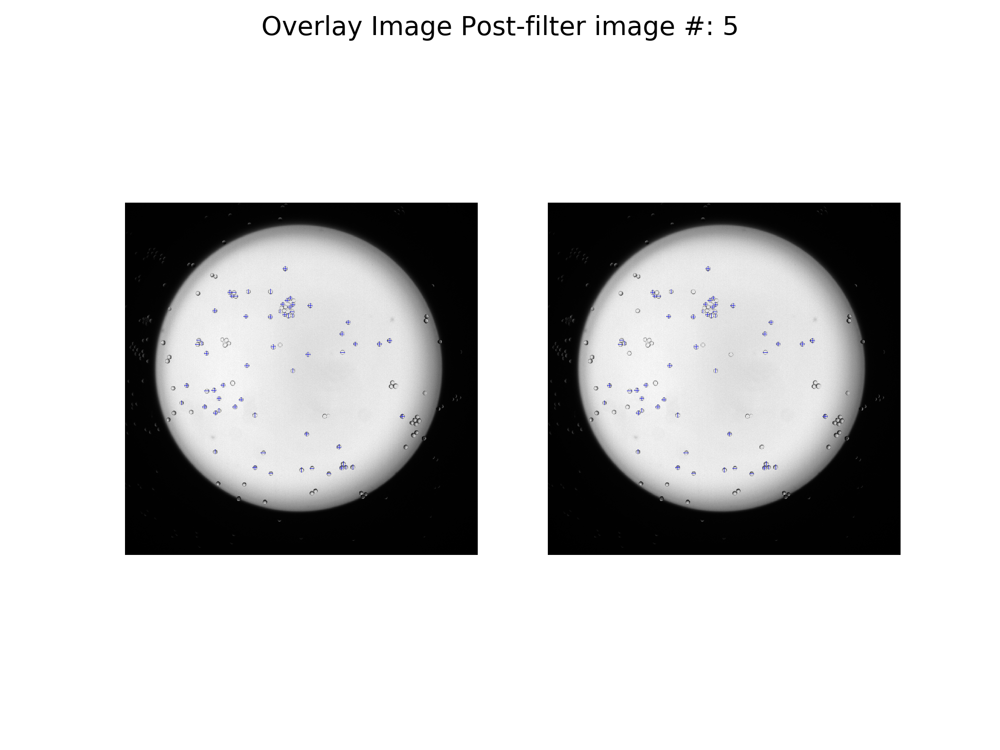

<IPython.core.display.Javascript object>


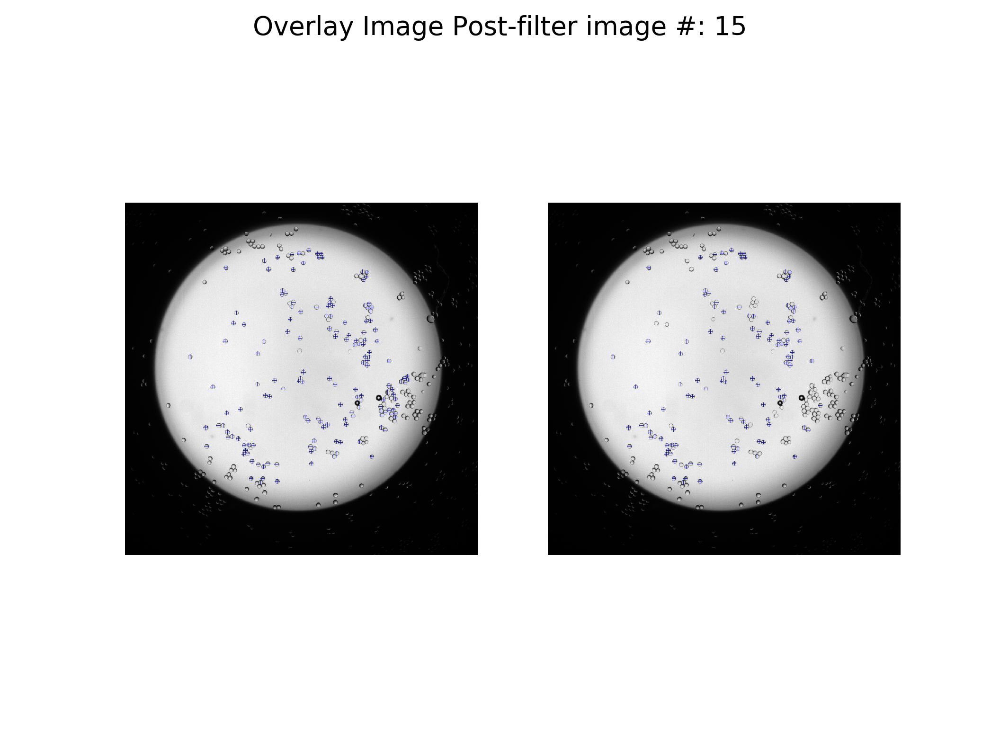

<IPython.core.display.Javascript object>


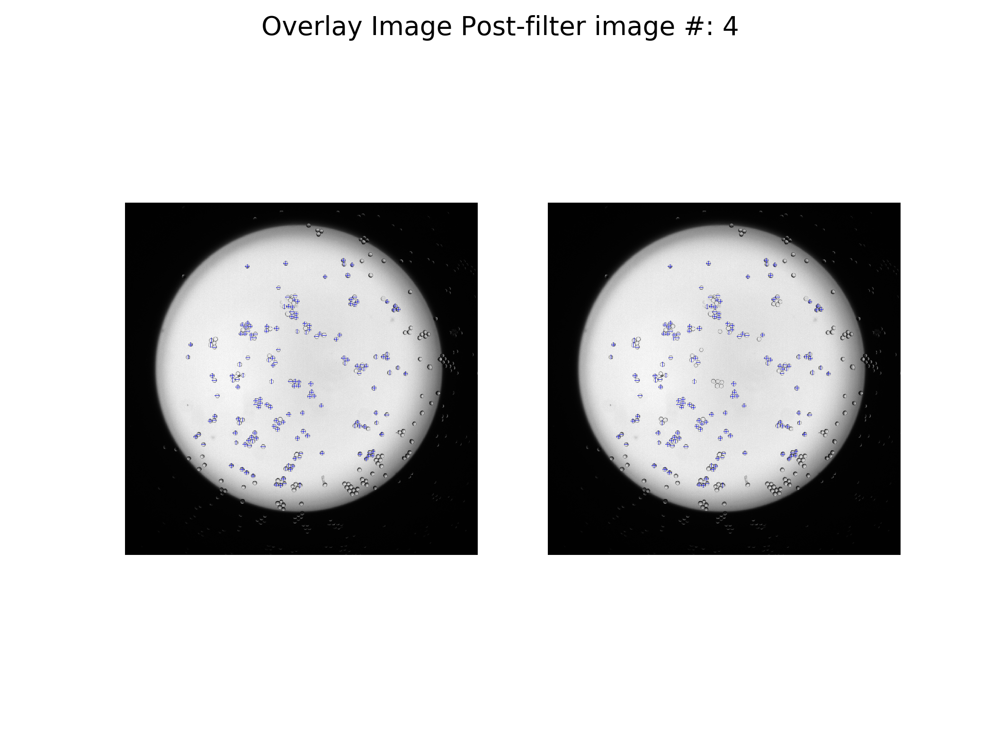

Delta:  0.0189997635388
Delta:  0.00183615569833
Delta:  0.0
Converged after: 3
Tranformation matrix:  [[  1.79254586e-01  -3.91369146e-03   2.85918874e-02]
 [  6.32235705e-03   3.38699147e-01   5.96251980e-03]
 [  5.04448746e-04  -3.83838311e-03   8.42073580e-01]]
Offset vector:  [-0.00261254 -0.00626628 -0.00784325]
Number of unique codes found: 48
Missing codes: None
Silhouette Coefficient: 0.658687249237
AIC: -34406.5777242
BIC: -31563.2600197
Pre-filter: 3090
Pre log-prob filter: 2796
Final beads no.: 2740
Total filtered out: 11.33%
Filtered/Total: 350/3090
Analyzing condition: 1000 nM
Analyzing channel: Cy5
Found 36 beads in image 1
Found 45 beads in image 2
Found 62 beads in image 3
Found 22 beads in image 4
Found 97 beads in image 5
Found 83 beads in image 6
Found 24 beads in image 7
Found 49 beads in image 8
Found 160 beads in image 9
Found 159 beads in image 10
Found 67 beads in image 11
Found 50 beads in image 12
Found 94 beads in image 13
Found 53 beads in image 14
Found 12

<IPython.core.display.Javascript object>


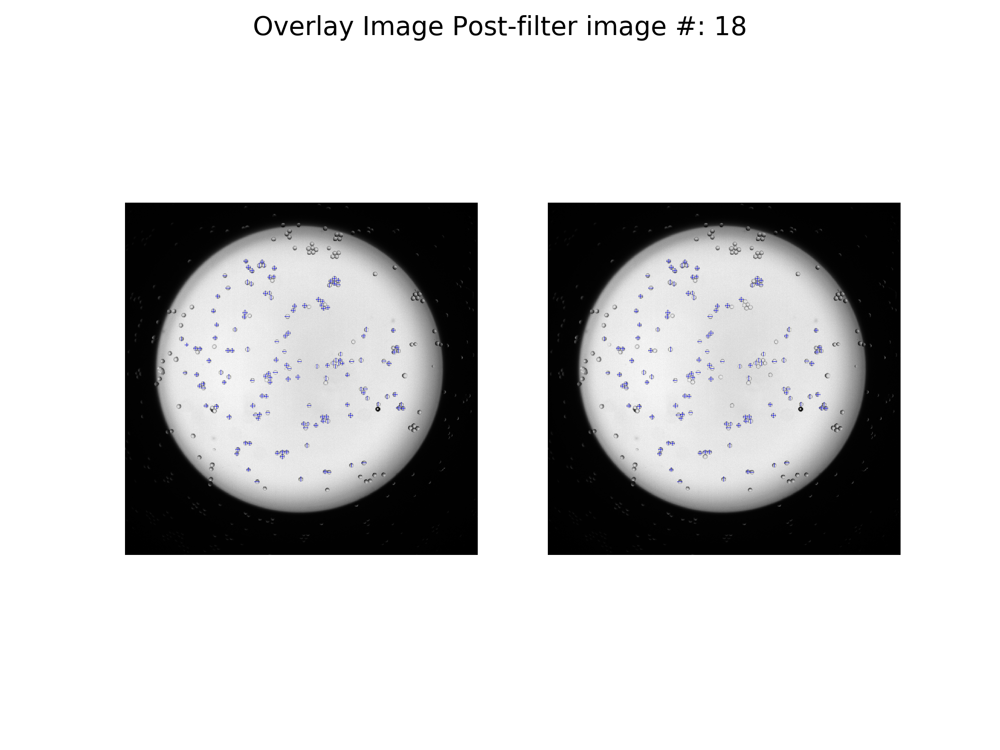

<IPython.core.display.Javascript object>


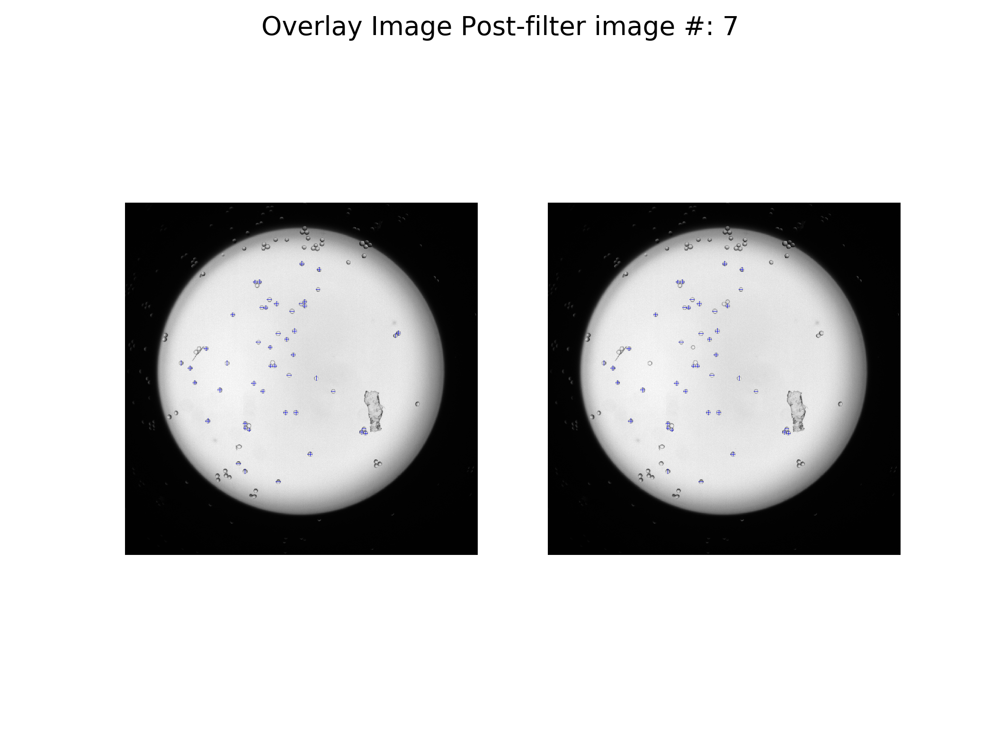

<IPython.core.display.Javascript object>


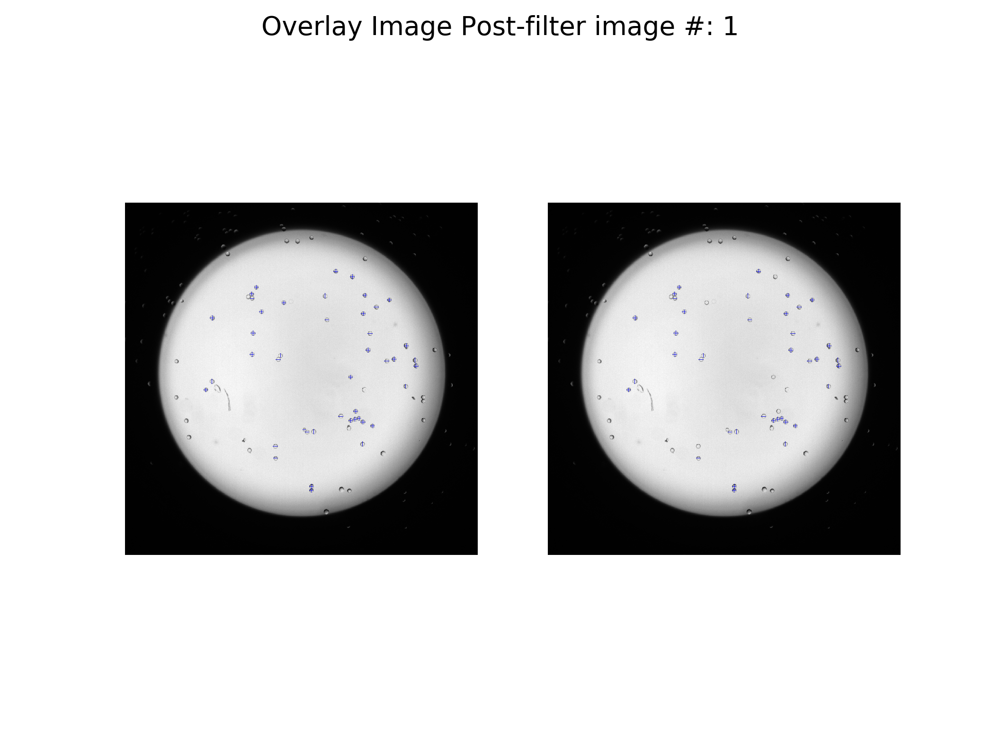

Delta:  0.0222753234211
Delta:  0.00454165609494
Delta:  0.000621201630442
Delta:  0.0
Converged after: 4
Tranformation matrix:  [[  1.78754113e-01  -3.57434551e-03   3.14077715e-02]
 [  6.02967991e-03   3.43300227e-01   4.92916066e-03]
 [  1.05889356e-03  -4.35429743e-04   8.64668368e-01]]
Offset vector:  [-0.00108495 -0.00680157 -0.00529345]
Number of unique codes found: 48
Missing codes: None
Silhouette Coefficient: 0.645097600987
AIC: -36083.8259449
BIC: -33203.7517796
Pre-filter: 3330
Pre log-prob filter: 3019
Final beads no.: 2936
Total filtered out: 11.83%
Filtered/Total: 394/3330


In [13]:
bead_sets_per_bead, bead_sets_per_code = bead_data_function(BEAD_IMAGE_FOLDER, BEAD_IMAGE_PATTERNS, ASSAY_CHANNELS)

In [15]:
#bead_sets_per_bead.to_pickle("20170809 - Pix2 - per bead.pickle")

In [ ]:
bead_sets_per_bead

In [24]:
fig = ba.inspect.cluster3d_check(bead_sets_per_bead.loc['50 nM'], target, gmix, set_prob=set_prob)
py.iplot(fig, filename='TEST/3D-Cluster')  # Online

### Per code stats

In [15]:
conc = '1000 nM'
code = 0
conf = 0.95
sd = bead_sets_per_bead[((bead_sets_per_bead.code>=code) & bead_sets_per_bead.confidence >conf)].loc[(conc)].Cy5.std()
mean = bead_sets_per_bead[((bead_sets_per_bead.code>=code) & bead_sets_per_bead.confidence >conf)].loc[(conc)].Cy5.mean()
med = np.median(bead_sets_per_bead[((bead_sets_per_bead.code>=code) & bead_sets_per_bead.confidence >conf)].loc[(conc)].Cy5)
N = len(bead_sets_per_bead[((bead_sets_per_bead.code>=code) & bead_sets_per_bead.confidence >conf)].loc[(conc)].Cy5)
print(sd/sqrt(N))

58.9524065637


In [17]:
#bead_sets_per_bead[((bead_sets_per_bead.code==code) & bead_sets_per_bead.confidence >conf)].loc[(conc)].dim_area

In [18]:
bead_sets_per_bead[((bead_sets_per_bead.code>=0) & bead_sets_per_bead.confidence > conf)].loc[(conc)].dim_area.std()

16.088177361334967

### Per bead data

In [55]:
#bead_sets_per_code.loc[('50 nM', 'Cy5')]

### Data export

In [21]:
folder_prefix = r"Z:\Data\Setup 1\Huy\20170731 PKIVIT\20170801 - Folder 20170731 PKIVIT - Pos1to6 - "
# Export to Excel.
bead_sets_per_bead.to_excel(r"%sper bead - NOT NORM.xlsx"%folder_prefix)
bead_sets_per_code.to_excel(r"%sper code - NORM.xlsx"%folder_prefix)
bead_norm_per_bead.to_excel(r"%sper bead - Biotin.xlsx"%folder_prefix)
bead_norm_per_code.to_excel(r"%sper code - Biotin.xlsx"%folder_prefix)

# Export to CSV.
bead_sets_per_bead.to_csv(r"%sper bead - NOT NORM.csv"%folder_prefix)
bead_sets_per_code.to_csv(r"%sper code - NORM.csv"%folder_prefix)
bead_norm_per_bead.to_csv(r"%sper bead - Biotin.csv"%folder_prefix)
bead_norm_per_code.to_csv(r"%sper code - Biotin.csv"%folder_prefix)

# Export to Python dataframe: Pickle. Best for keeping oroginal data structure.
bead_sets_per_bead.to_pickle(r"%sper bead - NOT NORM.pickle"%folder_prefix)
bead_sets_per_code.to_pickle(r"%sper code - NORM.pickle"%folder_prefix)
bead_norm_per_bead.to_pickle(r"%sper bead - Biotin.pickle"%folder_prefix)
bead_norm_per_code.to_pickle(r"%sper code - Biotin.pickle"%folder_prefix)

## Graphs

### Histogram bead data

In [57]:
bs_data = bead_sets_per_bead.loc[('1000 nM', 'Cy5')]
x1 = bs_data.loc[:, 'Cy5']

x2 = ml_data_1000.Cy5

trace_1 = go.Histogram(
    name='100 nM Pix2 - Pyhton',
    x=x1,
    opacity=0.75
)
trace_2 = go.Histogram(
    name='100 nM Pix2 - Matlab',
    x=x2,
    opacity=0.75
)

data = [trace_1, trace_2]
layout = go.Layout(
    barmode='overlay',
    yaxis=dict(
        title="Fluorescence Intensity [A.U.]"
        )
)

fig = go.Figure(data=data, layout=layout)

py.iplot(fig, filename='TEST/Histogram')

### Bar-Plot - Grouped by sequence

In [133]:
# data_189 = bead_sets_per_code.loc[('1000 nM', 'Cy5_f_local')]
# N_189 = data_189.loc[data_189.code == -1].N
# x1 = data_189.loc[(data_189.code >= 0)]
# x1 = data_189.loc[(data_189.code >= 0)]

# trace_189_bar = go.Bar(
#     x=sequences.sequence,
#     y=x1.AVG,
#     name="30 minutes N=[%i]" %(N_189),
#     error_y=dict(
#         type='data',
#         array=x1.SEM,
#         visible=True
#     )
# )

# data = [trace_189_bar]

# layout = go.Layout( 
#     yaxis=dict(
#         title="Fluorescence Intensity [A.U.]"
#         ),
#     margin=go.Margin(
#         b=120
#     ),
#     legend=dict(
#         x=0,
#         y=1.0,
#         bgcolor='rgba(255, 255, 255, 0)',
#         bordercolor='rgba(255, 255, 255, 0)'
#     ),
#     barmode='group',
#     bargap=0.15,
#     bargroupgap=0.2
# )

# fig = go.Figure(data=data, layout=layout)
# py.iplot(fig, filename='TEST/Bar-Plot')

### Bar-Plot - Separated Codes

In [56]:
ml_data_1000 = pd.read_csv(r'201708010_Pix2_ML_1uM.csv')
ml_data_1000_per_code = ba.simp.get_stats_per_code(ml_data_1000, 'Cy5')
py_data_1000_per_code = ba.simp.get_stats_per_code(bead_sets_per_bead[(bead_sets_per_bead.log_prob > 1)].loc['1000 nM'], 'Cy5')

In [43]:
ml_data_1000 = pd.read_csv(r'201708010_Pix2_ML_100nM.csv')
ml_data_1000_per_code = ba.simp.get_stats_per_code(ml_data_1000, 'Cy5')
py_data_1000_per_code = ba.simp.get_stats_per_code(bead_sets_per_bead[(bead_sets_per_bead.log_prob > 1)].loc['100 nM'], 'Cy5')

In [59]:
ml_data_1000 = pd.read_csv(r'201708010_Pix2_ML_50nM.csv')
ml_data_1000_per_code = ba.simp.get_stats_per_code(ml_data_1000, 'Cy5')
py_data_1000_per_code = ba.simp.get_stats_per_code(bead_sets_per_bead[(bead_sets_per_bead.log_prob > 1)].loc['50 nM'], 'Cy5')

In [1]:
data_py = py_data_1000_per_code
N_py = data_py.loc[data_py.code == -1].N
x1 = data_py.loc[((data_py.code >= 0))]
data_ml = ml_data_1000_per_code
N_ml = data_ml.loc[data_ml.code == -1].N
x2 = data_ml.loc[((data_ml.code >= 0))]

seq_names = []
seq_N = []
for seq_idx, seq_name in enumerate(sequences.sequence):
    seq_names.append("%i - %s" %(seq_idx+1, seq_name))

trace_1000_py = go.Bar(
    x=seq_names,
    y=x1.AVG,
    name="100 nM Python N=[%i]" %(N_py),
    text=x1.N,
    error_y=dict(
        type='data',
        array=x1.SEM,
        visible=True
    )
)

trace_1000_ml = go.Bar(
    x=seq_names,
    y=x2.AVG,
    name="100 nM Matlab N=[%i]" %(N_ml),
    text=x2.N,
    error_y=dict(
        type='data',
        array=x2.SEM,
        visible=True
    )
)

data = [trace_1000_py, trace_1000_ml]

layout = go.Layout( 
    yaxis=dict(
        title="Fluorescence Intensity [A.U.]"
        ),
    margin=go.Margin(
        b=160
    ),
    legend=dict(
        x=0,
        y=1.0,
        bgcolor='rgba(255, 255, 255, 0)',
        bordercolor='rgba(255, 255, 255, 0)'
    ),
    barmode='group',
    bargap=0.15,
    bargroupgap=0.2
)

fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='TEST/Bar-Plot-Separate')

NameError: name 'py_data_1000_per_code' is not defined

In [42]:
py_data_1000_per_code

,code,AVG,SD,N,CV,SEM,RSEM,MED
0,0.0,-96.299434,130.897049,38.0,-1.359271,21.234305,-0.220503,-99.942073
1,1.0,-94.972001,144.490663,85.0,-1.521403,15.672213,-0.165019,-110.993252
2,2.0,249.284895,349.774257,47.0,1.403111,51.019819,0.204665,208.951770
3,3.0,54.613617,448.896193,53.0,8.219492,61.660634,1.129034,8.447026
4,4.0,106.264479,453.498272,151.0,4.267637,36.905166,0.347295,18.363686
5,5.0,335.672492,201.025640,67.0,0.598874,24.559191,0.073164,314.310099
6,6.0,8321.494017,7405.773206,65.0,0.889957,918.573114,0.110386,5887.563374
7,7.0,-223.871740,117.201645,52.0,-0.523521,16.252944,-0.072599,-233.196563
8,8.0,-5.870226,306.711531,40.0,-52.248676,48.495351,-8.261241,-100.411065
9,9.0,-273.620763,107.250861,56.0,-0.391969,14.331999,-0.052379,-277.739042


In [39]:
ml_data_1000_per_code

,code,AVG,SD,N,CV,SEM,RSEM,MED
0,1,-176.672414,92.211115,87.0,-0.521933,9.886069,-0.055957,-175.000000
1,2,-193.823129,80.145887,147.0,-0.413500,6.610321,-0.034105,-197.000000
2,3,-177.977419,128.956036,155.0,-0.724564,10.357998,-0.058198,-190.000000
3,4,-186.213592,127.083827,103.0,-0.682463,12.521942,-0.067245,-174.500000
4,5,-199.575269,178.293282,93.0,-0.893364,18.488152,-0.092637,-180.000000
5,6,-166.536765,129.591448,68.0,-0.778155,15.715271,-0.094365,-157.750000
6,7,87.118182,230.984198,55.0,2.651389,31.145903,0.357513,65.000000
7,8,-206.253012,134.900842,83.0,-0.654055,14.807291,-0.071792,-206.000000
8,9,-167.531250,226.285043,96.0,-1.350703,23.095121,-0.137856,-161.750000
9,10,-219.389610,165.916554,77.0,-0.756264,18.907946,-0.086184,-192.500000


In [48]:
concs = [50,100,250,500,1000]
line_data = []
for seq_idx, seq in enumerate(sequences.sequence):
    conc_data = []
    conc_data_se = []
    for conc_label in concs:
        data = bead_sets_per_code[bead_sets_per_code.code==seq_idx].loc[('%s nM'%conc_label)]
        conc_data.append(data.AVG)
        conc_data_se.append(data.SD)
    line_data.append(
        go.Scatter(
            x=concs,
            y=conc_data,
            name=seq,
            error_y=dict(
                type='data',
                array=conc_data_se,
                visible=True
            )
        )
    )

layout = go.Layout( 
    title="Calcineurin - PKIVIT - Position 1-6 Sequences",
    xaxis=dict(
        title="Concentration [nM]"
        ),
    yaxis=dict(
        title="Mean Fluorescence Intensity +/- SD [A.U.]"
        ),
    legend=dict(
        x=0,
        y=1.0,
        bgcolor='rgba(255, 255, 255, 0)',
        bordercolor='rgba(255, 255, 255, 0)'
    )
)

fig = go.Figure(data=line_data, layout=layout)
py.iplot(fig, filename='CN/Pix2/Scatter-Plot-All')